### Imports


In [18]:
%matplotlib inline
%reload_ext autoreload
%autoreload 2

In [19]:
from shapely.geometry import mapping, shape
from shapely import affinity
from shapely.strtree import STRtree

In [20]:
import numpy as np
from itertools import zip_longest
import rtree.index
import math
import matplotlib.pyplot as plt
import matplotlib as mpl
from numpy import tan
from matplotlib.patches import Patch
from glob import glob
import pandas as pd
from pathlib import Path
import torch
import torch.nn as nn
from shapely.geometry import Polygon
from tqdm import tnrange, tqdm_notebook
from pathlib import Path
import json
from PIL import ImageDraw, ImageFont
from matplotlib import patches, patheffects
from fastai import vision
from fastai.data_block import *
from fastai.vision import *
from fastai.vision.learner import *
from fastai.vision.models import *
from fastai.vision.data import *
from fastai.metrics import error_rate, accuracy
torch.cuda.set_device(0)
torch.backends.cudnn.benchmark=True

In [21]:
mpl.rcParams['image.composite_image'] = False

### Load DE DATA

In [22]:
df_bbox = pd.read_csv('pklot_bbox_data.csv')
df_class = pd.read_csv('pklot_class_data.csv')
df_contour = pd.read_csv('pklot_contour_data.csv')
CATS = ['empty', 'occupied']

In [23]:
df_both = df_bbox.merge(df_class, left_on='image_path', right_on='image_path')
df_both.head()

,image_path,rotated_bbox,occupied
0,PKLot/PKLot/UFPR04/Rainy/2013-01-18/2013-01-18...,651 636 141 83 -34 705 563 139 77 -44 732 480 ...,0 1 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 ...
1,PKLot/PKLot/UFPR04/Rainy/2013-01-18/2013-01-18...,651 636 141 83 -34 705 563 139 77 -44 732 480 ...,0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 ...
2,PKLot/PKLot/UFPR04/Rainy/2013-01-18/2013-01-18...,651 636 141 83 -34 705 563 139 77 -44 732 480 ...,1 1 1 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 ...
3,PKLot/PKLot/UFPR04/Rainy/2013-01-18/2013-01-18...,651 636 141 83 -34 705 563 139 77 -44 732 480 ...,1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 ...
4,PKLot/PKLot/UFPR04/Rainy/2013-01-18/2013-01-18...,651 636 141 83 -34 705 563 139 77 -44 732 480 ...,1 1 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 ...


### Split the Data

In [7]:
from collections import defaultdict
from random import shuffle
pics = Path().glob("PKLot/PKLot/**/*.jpg")
path_to_cnt = defaultdict(int)
total = 0
for pic in pics:
    path_to_cnt[pic.parent] += 1
    total +=1
    
training = []
validation = []
cnt = 0
threshold = .8

dates = list(path_to_cnt.keys())
shuffle(dates)

for pic in dates:
    if (cnt < threshold * total):
        training.append(pic)
        cnt += path_to_cnt[pic]
    else:
        validation.append(pic)
        
training = set(training)
    
def pklot_train_test_split(o):
    image_path = Path(o)
    if image_path.parent in training:
        return False
    else:
        return True

### Visualize DE DATA

In [8]:
from helper_functions import *

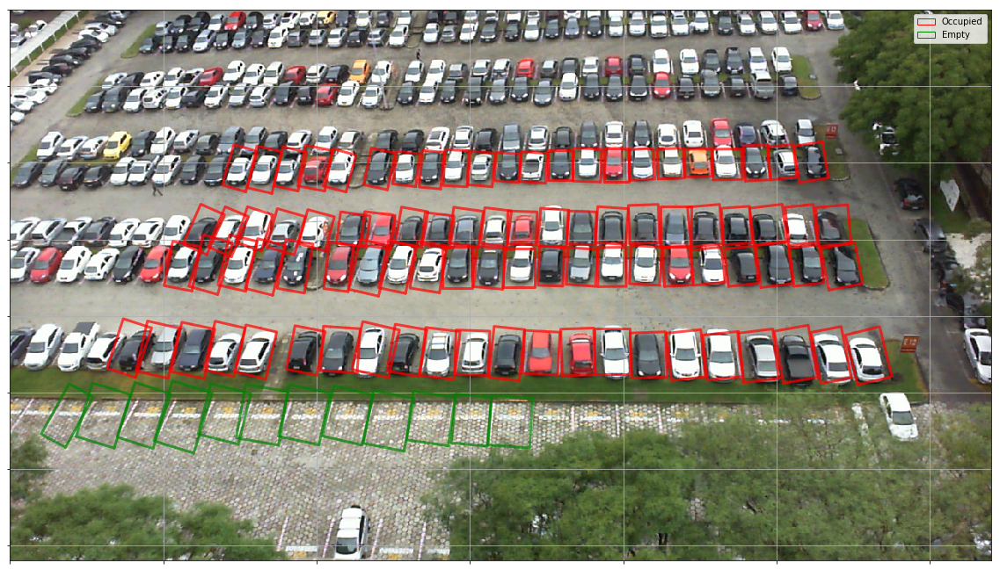

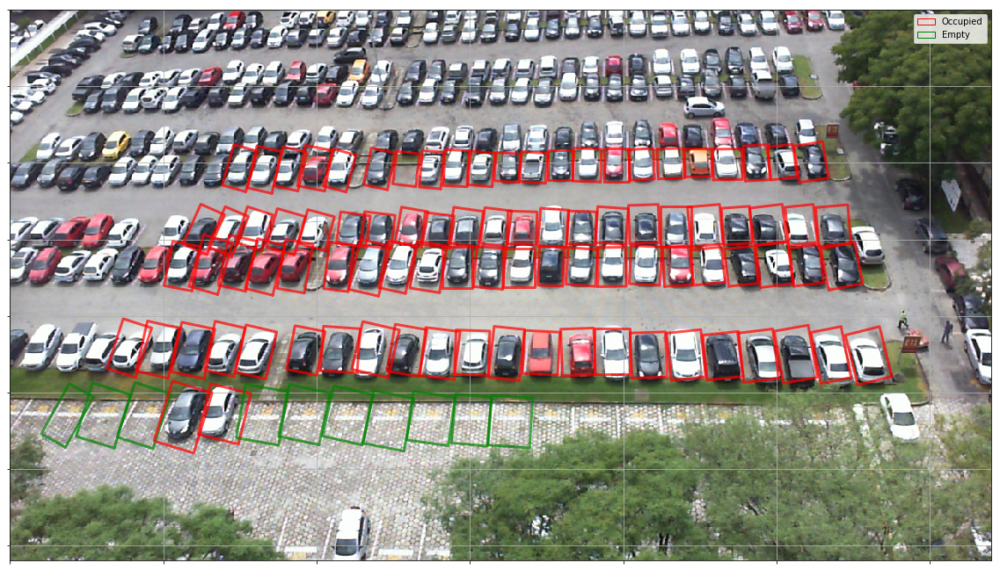

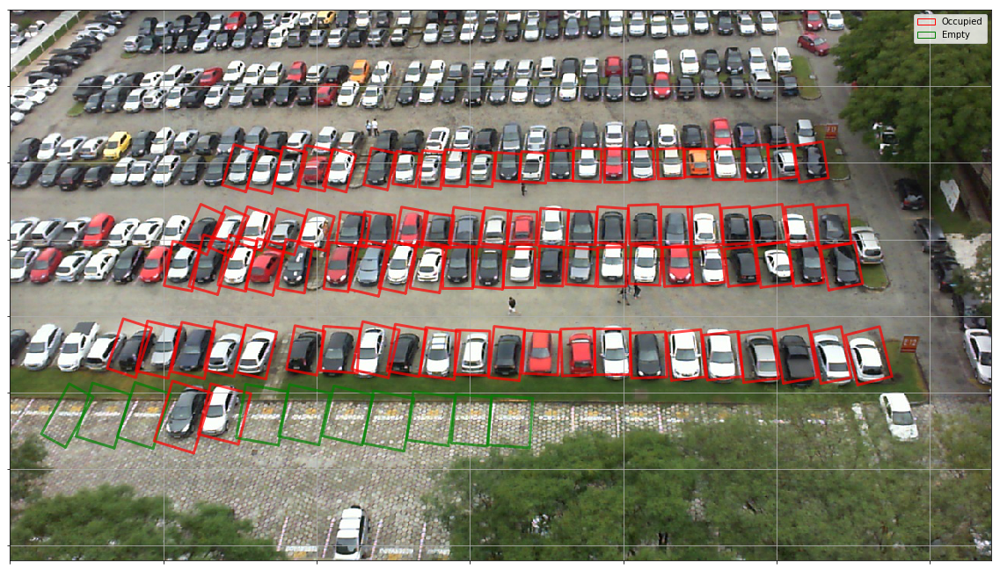

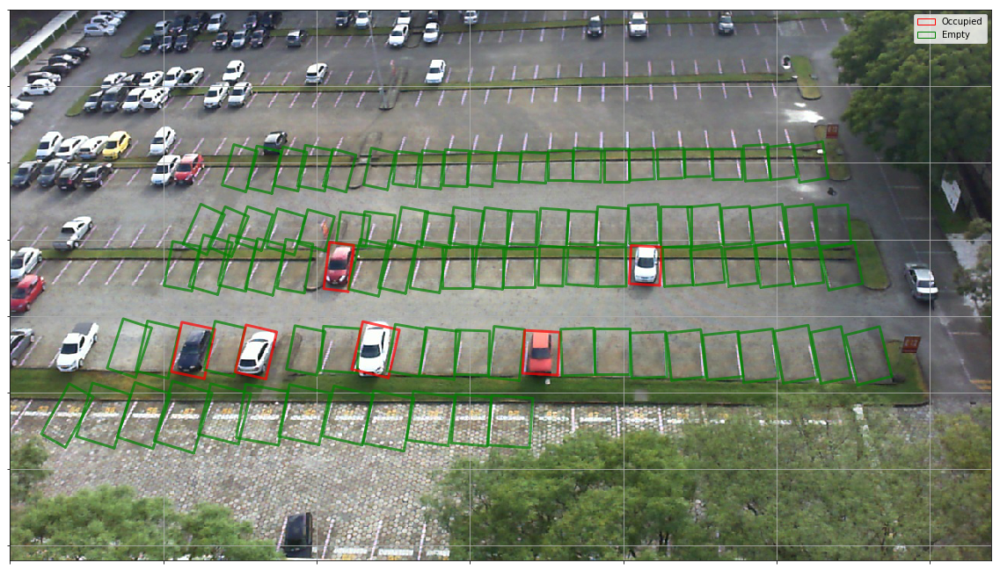

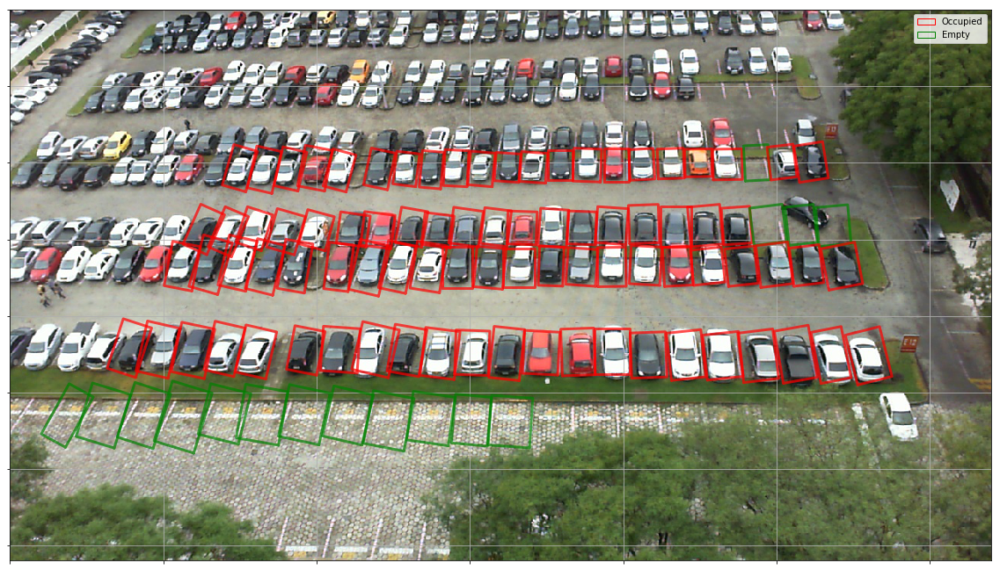

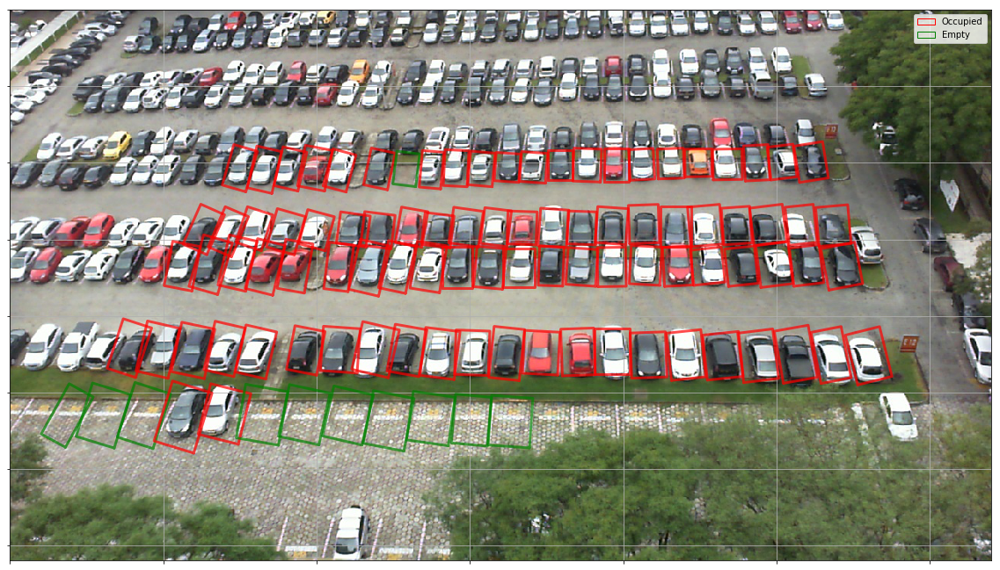

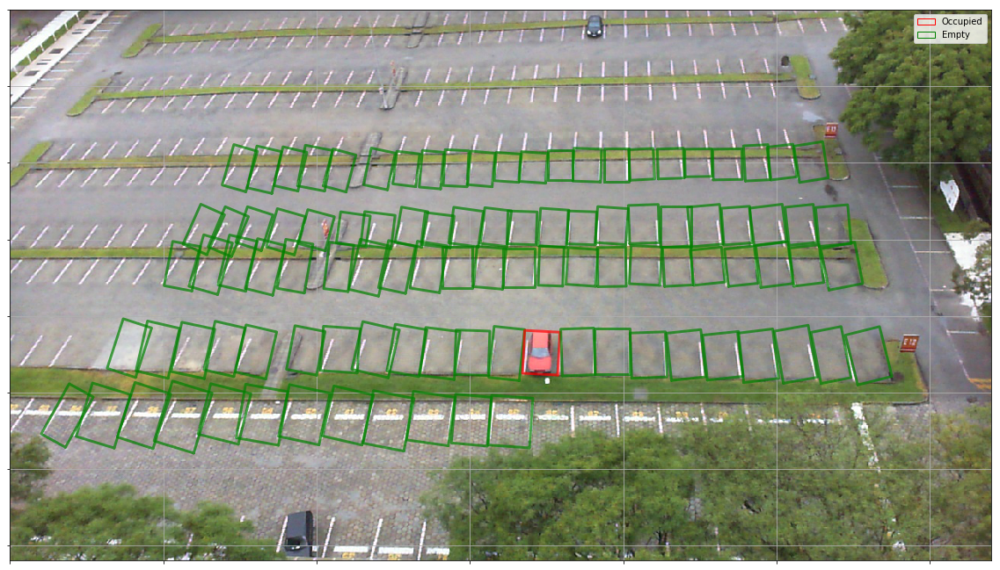

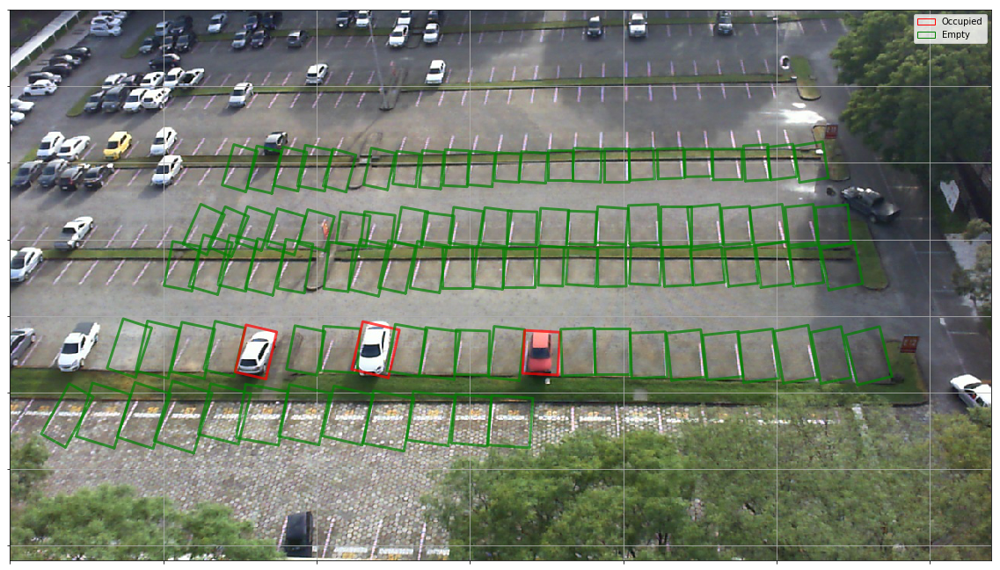

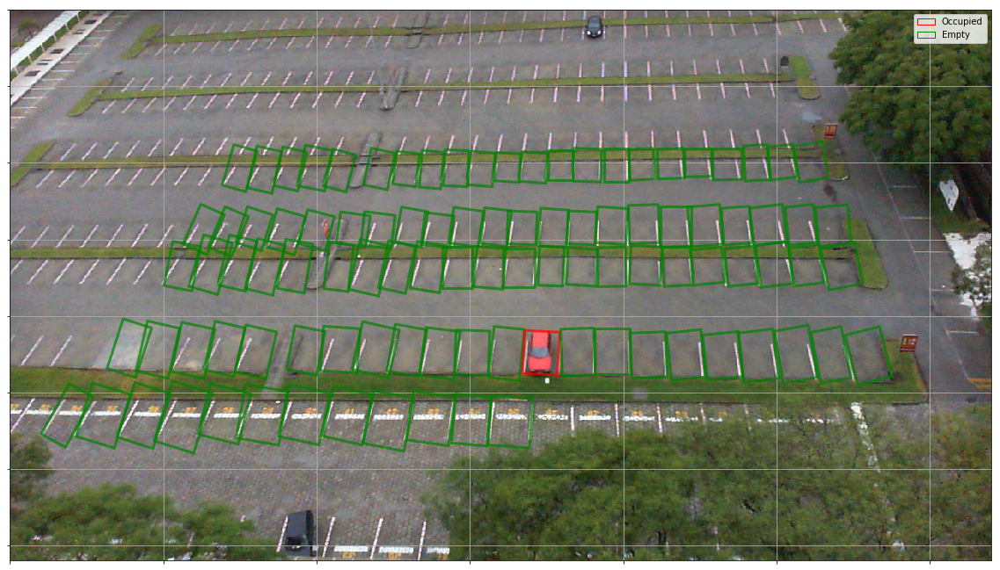

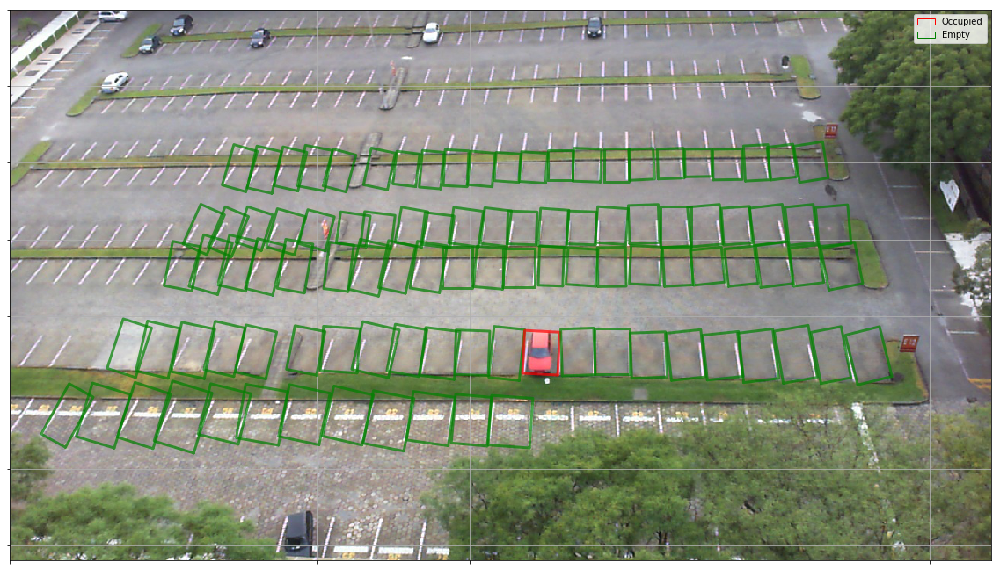

In [17]:


for pic in list(Path().glob("PKLot/PKLot/PUCPR/**/*.jpg"))[0:10]:
    fig, ax = plt.subplots(1, 1, figsize=(20, 15))
    show_truth(ax, df_both, str(pic))
    plt.show()

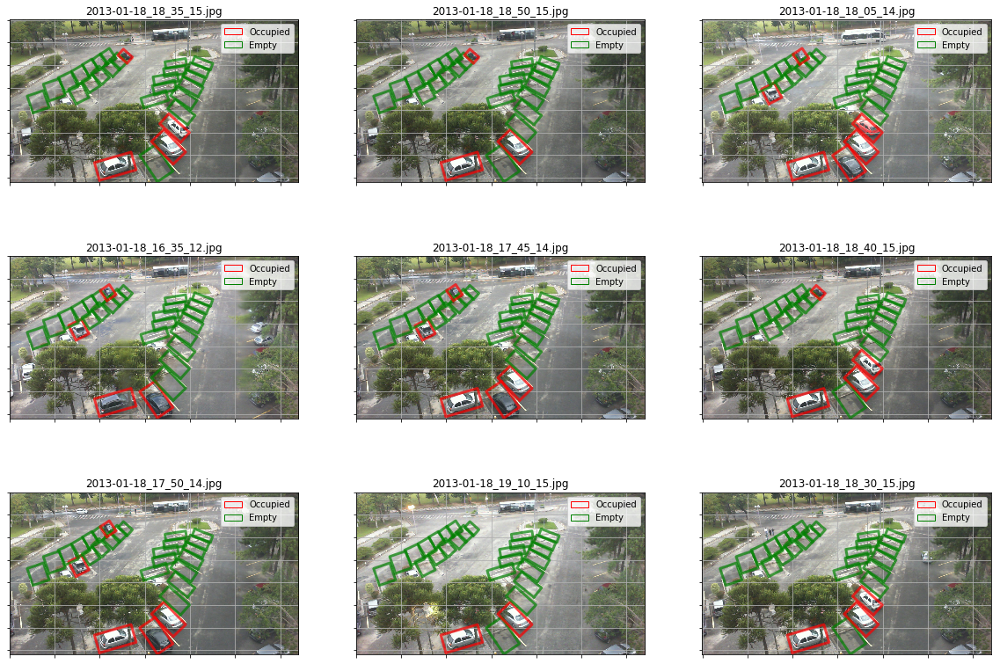

In [9]:
rows, cols = 3,3
images = df_both['image_path'][:rows*cols]
base_names = [Path(im).name for im in images]
fig, axes = plt.subplots(rows, cols, figsize=(20,14))
for i,ax in enumerate(axes.flat):
    show_truth(ax, df_both, images[i])
    ax.set_title(base_names[i])

### Neural Nework

In [43]:
padding_mode='zeros'
tfms=None
f_model = resnet34
sz=224
bs=2
data = (ImageItemList.from_df(path='.', df=df_both, cols='image_path')
                     .split_by_valid_func(pklot_train_test_split)
                     .label_from_df(cols=['occupied', 'rotated_bbox'])
                     .transform(tfms, size=sz, padding_mode=padding_mode)
                     .databunch(bs=bs, num_workers=4)
                     .normalize(imagenet_stats))

ValueError: could not convert string to float: '0 1 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0'

In [41]:
data

ImageDataBunch;

Train: LabelList (10035 items)
x: ImageItemList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: EmptyLabelList
,,,,
Path: .;

Valid: LabelList (2381 items)
x: ImageItemList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: EmptyLabelList
,,,,
Path: .;

Test: None

In [33]:
id2cat = CATS
res = (10, 15)
k = res[0] * res[1] # Number of Bounding boxes
bbox_vars = 5 * k

In [34]:
def one_hot_embedding(labels, num_classes):
    return torch.eye(num_classes, dtype=torch.double)[labels.data.cpu()]

class BCE_Loss(nn.Module):
    def __init__(self, num_classes):
        super().__init__()
        self.num_classes = num_classes

    def forward(self, pred, targ):
        t = one_hot_embedding(targ, self.num_classes+1)
        t = t[:,:-1].contiguous()#.cpu()
        x = pred[:,:-1]
        w = self.get_weight(x,t)
        #print(type(w))
        
        
        return F.binary_cross_entropy_with_logits(x, t, w, size_average=False)/self.num_classes
    
    def get_weight(self,x,t): return None

class FocalLoss(BCE_Loss):
    def get_weight(self,x,t):
        alpha,gamma = 0.25,2.
        p = x.sigmoid()
        pt = p*t + (1-p)*(1-t)
        w = alpha*t + (1-alpha)*(1-t)
        return w * (1-pt).pow(gamma)

In [38]:
class LossAnchorGridShapelyRTREE:
    
    def __init__(self, num_classes=2,res=(10, 10), doprint=False):
        """
        Paramters
        ---------
        num_classes (int): default=2
            num_classes is the number of different classes each anchor box
            can associate with (e.g. occupied, empty) 
            NOTICE: background will be included regardless of num_classes
        
        res (M, N): default=(10, 10)
            res is the resolution of the anchors, the init will create 
            an anchor grid of M rows x N cols
        
        """
        self.anchors = []        
        self.num_classes = num_classes
        self.res = res
        self.loss_f = FocalLoss(num_classes)
        
        self.num_anchors = res[1] * res[0]
        
        self.a_ic = torch.zeros([self.num_anchors, 5], dtype=torch.double)
        w, h = 1/res[0], 1/res[1]
        
        anchorId = 0
        for xLeft in np.arange(res[1]):
            xRight = xLeft + 1
            for yBottom in np.arange(res[0]):
                yTop = yBottom + 1
                
                cx = (xLeft + .5)/res[1]
                cy = (yBottom + .5)/res[0]
                ang = 0
                
                self.a_ic[anchorId] = torch.tensor([cx, cy, w, h, ang])
                
                poly = Polygon([(xLeft/res[1],yBottom/res[0]),(xLeft/res[1],yTop/res[0])
                                ,(xRight/res[1],yTop/res[0]),(xRight/res[1],yBottom/res[0])])
                poly.id = anchorId
                
                anchorId += 1
                self.anchors.append(poly)
        
        
        self.shapleyRTree = STRtree(self.anchors)
        
        
        self.threshold = .5 
        
        
    
            
    def getIntersectingAnchors(self,boundingPoly, doprint=False):
        """
        returns all the intersecting anchors with the given polygon
        
        Parameters
        ---------
        boundingPoly: shapely Polygon
        """
        return self.shapleyRTree.query(boundingPoly)
    
    
    def getOverlapIou(self, boundingPolys, doprint=False):
        """
        returns the iou scores of anchors vs boundingPolys

        Parameters
        ----------
        boundingPolys: a list of shapely Polygons
        
        Returns
        -------
        overlaps: torch.Tensor((M,N), dtype=double)
            A torch array of size M (# of anchors) x N (# of boundingPolys)
            This array represents the IoU scores of each anchor box versus
            each bounding polygon object
        """
        
        
        
        overlaps = torch.zeros([self.num_anchors,len(boundingPolys)], dtype=torch.double)
        fig, ax = plt.subplots(1,1, figsize=(9,9))

        for j, boundPoly in enumerate(boundingPolys):
            for anchorPoly in self.getIntersectingAnchors(boundPoly):
                draw_poly(ax, anchorPoly, c='green')
                draw_poly(ax, boundPoly, c='red')
                
                inter = anchorPoly.intersection(boundPoly).area
                iou = inter / (anchorPoly.area + boundPoly.area - inter)
                overlaps[anchorPoly.id, j] = iou                
        plt.show()
        return overlaps
    
    def getLoss(self, b_c, b_bb, bbox, clas, doprint=False):
        """
        Parameters
        ----------
        b_c: tensor(Num of Anchor boxes x num_classes + 1)
            predicted classifications
        b_bb: tensor(Num of Anchor boxes x 5)
            predicted bounding boxes
        clas: tensor(Nx1)
            a tensor of classifications for ground truth boxes
        bbox: tensor(Nx5)
            tensor of bounding boxes for the ground truth
        """
        
        boundingPolys = createPolygons(b_bb.cpu().numpy().reshape(-1,))
        
        overlaps = self.getOverlapIou(boundingPolys, doprint)
        
        
        prior_overlap, prior_idx = overlaps.max(0) # for each ground truth object, find anchor box that has max overlap (highest jaccard index) with it
        gt_overlap, gt_idx = overlaps.max(1) # for each anchor box, find max jaccard index and which obj category this corresponds to
        gt_overlap[prior_idx] = 1.99 # set jaccard index of matched anchor boxes to 1.99
        for i,o in enumerate(prior_idx): gt_idx[o] = i # redefine the 'matched' indices in gt_idx to prior_idx indices. take a look below at gt_overlap and gt_idx values where gt_overlap = 1.99
        if doprint: print(gt_overlap, gt_idx)
        
        gt_clas = clas[gt_idx] # define the gt category for each matched anchor box
        pos = gt_overlap > self.threshold # bool array for anchor box jaccards > threshold value, i've changed from 0.3 to 0.2 to illustrate how gt_overlap[12] (==0.2598) is counted as 'pos'
        pos_idx = torch.nonzero(pos)[:,0]
        gt_clas[1-pos] = self.num_classes # setting class category to background
        gt_bbox = bbox[gt_idx] # define the gt_bboxes for each matched anchor box
        if doprint: print(gt_clas, gt_bbox)
            
            
        
        t = gt_bbox[pos_idx]
        p = self.a_ic[pos_idx]
        
        
        loc_loss =  torch.sum((t[:, 0] - p[:, 0]).abs()/p[:, 2])
        loc_loss += torch.sum((t[:, 1] - p[:, 1]).abs()/p[:, 3])
        loc_loss += torch.sum(torch.log(t[:, 2]/p[:, 2]))
        loc_loss += torch.sum(torch.log(t[:, 3]/p[:, 3]))
        loc_loss += torch.sum(torch.tan(t[:, 4] - p[:, 4]).abs())
        
#         ((self.a_ic[pos_idx][:4] - gt_bbox[pos_idx][:4]
#                     + torch.tan(self.a_ic[pos_idx][4] - gt_bbox[pos_idx][4]).abs()).mean() # calc regression loss (L1 = absolute mean distance between each predicted bbox value and gt value)
        
        clas_loss  = self.loss_f(b_c, gt_clas) # calc classification loss (binary cross entropy or focal loss)
        
        return loc_loss, clas_loss
    
    
    def ssdLoss(self, pred, targ, doprint=False):
        total_class_loss, total_loc_loss = 0., 0.
        print(pred, targ)
        for b_c, b_bb, bbox, clas in zip(*pred, *targ):
            loc_loss, clas_loss = self.getLoss()
            total_loc_loss += loc_loss
            total_class_loss += clas_loss
        
        return total_loc_loss + total_class_loss

In [39]:
testAnchor = LossAnchorGridShapelyRTREE(2, res)
class StdConv(nn.Module):
    def __init__(self, nin, nout, stride=2, drop=0.1):
        super().__init__()
        self.conv = nn.Conv2d(nin, nout, 3, stride=stride, padding=1)
        self.bn = nn.BatchNorm2d(nout)
        self.drop = nn.Dropout(drop)
        
    def forward(self, x): return self.drop(self.bn(F.relu(self.conv(x))))
        
def flatten_conv(x,k):
    bs,nf,gx,gy = x.size()
    x = x.permute(0,2,3,1).contiguous()
    return x.view(bs,-1,nf//k)

class OutConv(nn.Module):
    def __init__(self, k, nin, bias):
        super().__init__()
        self.k = k
        self.oconv1 = nn.Conv2d(nin, (len(id2cat)+1)*k, 3, padding=1) #categories
        self.oconv2 = nn.Conv2d(nin, bbox_vars, 3, padding=1) #bounding boxes
        self.oconv1.bias.data.zero_().add_(bias)
        
    def forward(self, x):
        return [flatten_conv(self.oconv1(x), self.k),
                flatten_conv(self.oconv2(x), self.k)]
    
class SSD_Head(nn.Module):
    def __init__(self, k, bias):
        super().__init__()
        self.drop = nn.Dropout(0.25)
        self.sconv0 = StdConv(512,256, stride=1)
#         self.sconv1 = StdConv(256,256)
        self.sconv2 = StdConv(256,256)
        self.out = OutConv(k, 256, bias)
        
    def forward(self, x):
        x = self.drop(F.relu(x))
        x = self.sconv0(x)
#         x = self.sconv1(x)
        x = self.sconv2(x)
        return self.out(x)

head_reg4 = SSD_Head(k, -3.)
learn = create_cnn(data, f_model, custom_head=head_reg4)
learn.opt_fn = optim.Adam
k

150

In [40]:
learn.loss_func = testAnchor.ssdLoss
x,y = next(iter(data.train_dl))
# x,y = V(x).cpu(),V(y)
x,y = x.cuda(), y.cuda()
for i,o in enumerate(y): y[i] = o.cuda()
learn.model.cuda()
batch = learn.model(x)
testAnchor.ssdLoss(batch, y, True)

[tensor([[[-0.5803,  0.5898,  0.3242],
         [-1.1313, -0.4465, -0.3155],
         [-0.3384,  0.1609,  1.3022],
         ...,
         [ 0.6297, -1.3795,  0.3094],
         [ 0.3711, -0.1010,  1.1398],
         [ 0.3934,  0.9453,  0.0126]],

        [[ 0.5089,  0.0084, -0.4068],
         [-0.7086,  0.5597, -0.3730],
         [ 0.9831, -0.7189,  0.8041],
         ...,
         [-0.4499,  0.2052, -0.4127],
         [-1.0950,  0.0847,  0.8742],
         [ 0.5496,  1.0991,  0.8624]]], device='cuda:0',
       grad_fn=<ViewBackward>), tensor([[[-0.4762,  0.5556,  0.1928,  0.3489, -1.2742],
         [-0.2967, -0.6164,  0.1498, -0.4462, -0.7704],
         [ 0.2291,  0.2912, -1.0479, -0.4176,  0.0609],
         ...,
         [ 0.3966, -0.1934,  0.1424,  1.3386, -0.2781],
         [ 0.3494,  0.8949,  0.0164,  0.4655,  0.0809],
         [ 0.7086, -0.2905,  0.7729,  0.3177,  0.0279]],

        [[ 0.4330,  0.2345,  0.5757, -0.1128,  0.1849],
         [-0.2218,  0.0570, -0.5601, -1.1481,  0.3779]

TypeError: zip argument #3 must support iteration